In [1]:
import sys # for automation and parallelization: set manual to false when run by a launcher
manual, scenario = (True, 'base') if 'ipykernel' in sys.argv[0] else (False, sys.argv[1])

# CREATE PATHWAYS

In [2]:
import sys
sys.path.insert(0, r'../../../quetzal')
from quetzal.model import stepmodel
import matplotlib.pyplot as plt
if manual:
    %matplotlib inline

PyTables is not installed. No support for HDF output.


In [3]:
training_folder = '../../'
plot_path = training_folder + 'outputs/plot/'

## Read model

In [4]:
sm = stepmodel.read_zippedpickles(training_folder + r'models/base/road_model')

links:  36%|███▋      | 8/22 [00:00<00:00, 39.60it/s]

zones: 100%|██████████| 22/22 [00:01<00:00, 21.93it/s]                  


# Clusterize Transport Nodes

In [5]:
sm.preparation_clusterize_nodes(distance_threshold=300, prefix='stop_area_')

can not add prefixes on table:  footpaths


# Footpaths
Footpaths are pathways connecting public transport nodes. Attribute *sm.footpaths* will be added.

In [6]:
sm.preparation_footpaths(max_length=2000, speed=3, n_clusters=3000)

# Access and Eggress
Acces and Eggress (also called ntlegs) are pathways connecting zones to transport nodes and road node (if walk on road is activated). Those attributes are added:
- *sm.zone_to_transit* (if zone_to_transit=True)
- *sm.zone_to_road* (if zone_to_road=True)
- *sm.road_to_transit* (if zone_to_road=True)

In [8]:
threshold = 200
sm.preparation_ntlegs(
    short_leg_speed=3,
    long_leg_speed=7,
    threshold=threshold,
    zone_to_transit=True,
    zone_to_road=True,
    n_ntlegs=5
)

In [9]:
sm._add_type_prefixes(prefixes={'zone_to_transit': 'ztt_', 
                                'zone_to_road': 'ztr_', 
                                'road_to_transit': 'rtt_'})
sm.zone_to_transit.head(1)

,a,b,rank,distance,geometry,direction,speed_factor,short_leg_speed,long_leg_speed,speed,time,walk_time
ztt_0,zone_0,stop_area_220,0,89.835304,LINESTRING (259852.4406498853 6251299.59777299...,access,0.670206,3,7,3.0,107.802365,107.802365


# Export

In [8]:
sm.to_zippedpickles(training_folder + 'models/base/walk_model')  

  0%|          | 0/29 [00:00<?, ?it/s]

zone_to_road: 100%|██████████| 29/29 [00:02<00:00, 13.77it/s]   


# PLOT 
## clustering

In [9]:
def plot_clustering(self, figsize=[25, 25],url=None, *args, **kwargs):
    fig, ax_array = plt.subplots(2, 2,  figsize=figsize, tight_layout=True) 
    plot = sm.plot(
        'disaggregated_nodes', markersize=5, color='green',
        basemap_url=url, title="Original Stops {}".format(len(sm.disaggregated_nodes)), fontsize=36, ax=ax_array[0][0],
    )
    plot = sm.plot(
        'node_parenthood', linewidth=2,
        ax=sm.plot('disaggregated_nodes',  markersize=5, color='green', ax=ax_array[0][1]),
        basemap_url=url, title="Stop Clusters {}".format(len(sm.nodes)), fontsize=36
    )
    plot = sm.plot(
        'nodes', color='green', markersize=5,
        ax=sm.plot('node_clusters', alpha=0.7, edgecolor='black', ax=ax_array[1][0]),
        basemap_url=url, title="Stop Clusters", fontsize=36
    )
    plot = sm.plot(
        'nodes', color='green', markersize=20, basemap_url=url,
        title="Aggregated stops", fontsize=36, ax=ax_array[1][1]
    )
    return fig

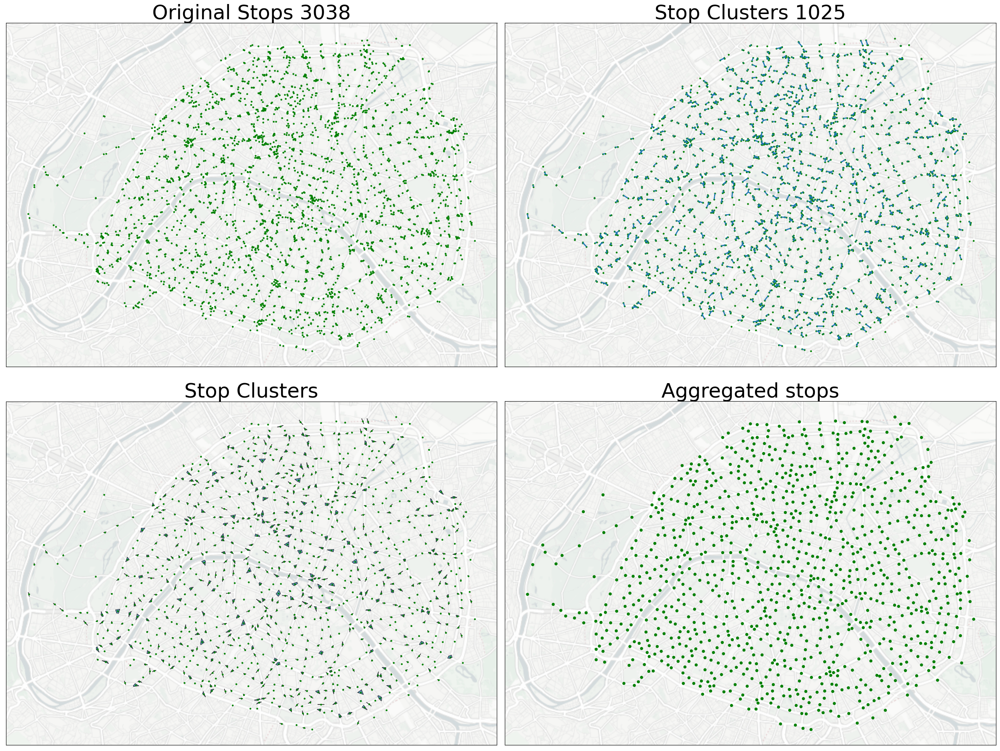

In [10]:
if manual:
    fig = plot_clustering(sm, url='http://a.basemaps.cartocdn.com/light_nolabels/tileZ/tileX/tileY.png')

## walk model

In [11]:
def plot_walkmodel(self, figsize=[25, 25],url=None, *args, **kwargs):
    fig, ax_array = plt.subplots(2, 2,  figsize=figsize, tight_layout=True)
    plot = sm.plot('centroids', color='red', markersize=100,
        ax=sm.plot('nodes', markersize=10, color='red',
            ax=sm.plot('zone_to_transit', linewidth=1,
                      ax=sm.plot('zones', linewidth=1, alpha=1, edgecolor='black', color='none', 
                                ax=sm.plot('footpaths', alpha=0, ax=ax_array[0][0])))
        ),
        basemap_url=url,
        title="Acces and Egress links (Zone to Transit)", fontsize=36
    )
    plot = sm.plot(
        'footpaths', color=None, linewidth=1,
        ax=sm.plot('nodes', markersize=50, ax=sm.plot('zones',alpha=0, ax=ax_array[0][1])),
        basemap_url=url, title="Stops & Footpaths", fontsize=36
    )

    plot = sm.plot(
        'footpaths', color=None, linewidth=1,
        ax=sm.plot('zone_to_transit', linewidth=1, color='k',  ax=sm.plot('zones',alpha=0, ax=ax_array[1][0]) ),
        basemap_url=url,
        title="Full Pedestrian Graph (as the Crow Flies)", fontsize=36
    )
    plot = sm.plot('road_links', color='green',linewidth=0.5, ax=sm.plot(
        'road_to_transit',  linewidth=1, color='k',
        ax=sm.plot('zone_to_road', linewidth=1, color='green', ax=sm.plot('zones',alpha=0, ax=ax_array[1][1]) )),
        basemap_url=url,
        title="Full Pedestrian Graph (Walk on Road)", fontsize=36
    )
    return fig

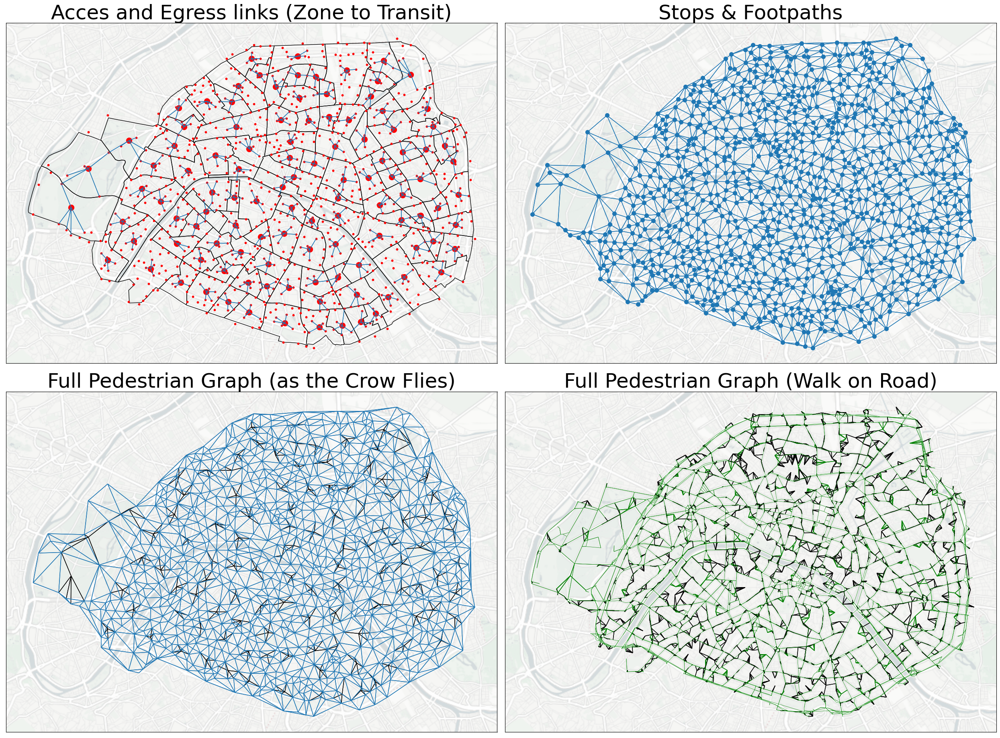

In [12]:
if manual:
    fig = plot_walkmodel(sm, url='http://a.basemaps.cartocdn.com/light_nolabels/tileZ/tileX/tileY.png')

# zone_to_transit monitoring

In [11]:
import matplotlib.pyplot as plt

Text(0.5, 1.0, 'Access & egress links: speed VS distance')

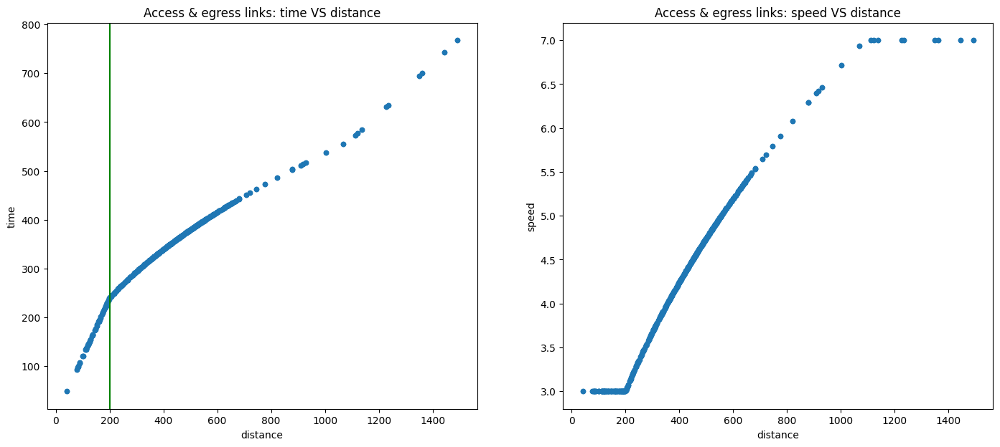

In [12]:
fig, axes = plt.subplots(1, 2, figsize=[17, 7])
ax = sm.zone_to_transit.plot(kind='scatter', x='distance', y='time', ax=axes[0])
ax.axvline(x=threshold, color='green')
ax.set_title('Access & egress links: time VS distance')
ax = sm.zone_to_transit.plot(kind='scatter', x='distance', y='speed', ax=axes[1])
ax.set_title('Access & egress links: speed VS distance')